<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 4 Combined: West Nile Virus Prediction

--- 
# Contents


---

### Contents:
Notebook 2

--- 
# Cost benefit analysis

---

In [99]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import timedelta
from shapely.geometry import Point,polygon

plt.style.use('fivethirtyeight')

%matplotlib inline

In [100]:
train = pd.read_csv('../datasets/df_train.csv') #need NumMosquitos, Wnapresent, longitude and latitude, week, dates
spray = pd.read_csv('../datasets/spray_cleaned.csv') #with longitude and latitude, dates

# Spray area

In [101]:
spray.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14740 entries, 0 to 14739
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       14740 non-null  object 
 1   Time       14156 non-null  object 
 2   Latitude   14740 non-null  float64
 3   Longitude  14740 non-null  float64
 4   Year       14740 non-null  int64  
 5   Month      14740 non-null  int64  
 6   Day        14740 non-null  int64  
dtypes: float64(2), int64(3), object(2)
memory usage: 806.2+ KB


In [102]:
#Drop duplicates in spray
spray = spray[spray.duplicated(subset=['Date','Latitude','Longitude'])==False]

In [103]:
#spray1 = values for spray for year 2011
spray1 = spray.loc[spray['Date']> '2011-01-01']
spray1 = spray1.loc[spray['Date']< '2012-01-01']

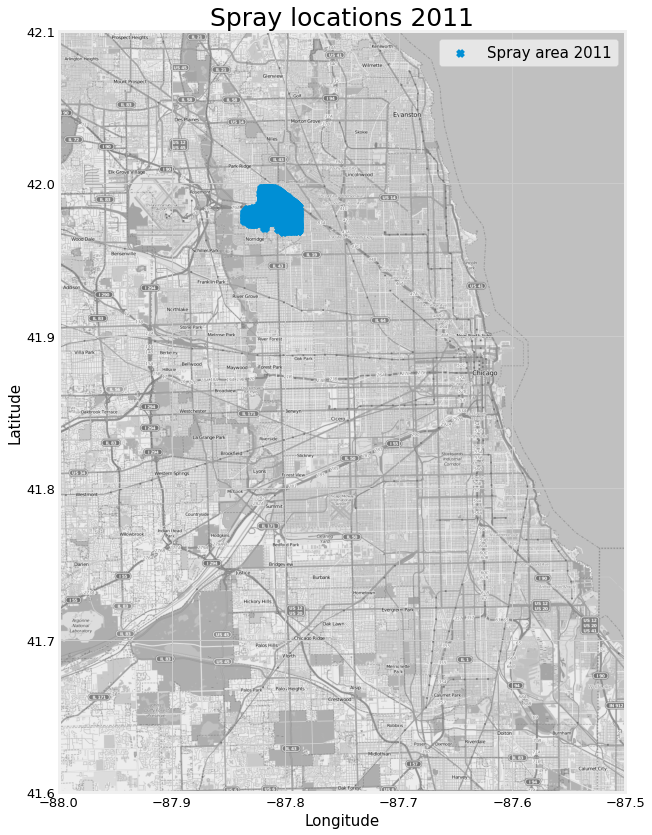

In [104]:
mapdata = np.loadtxt("../datasets/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

spray_locations = spray1[['Longitude', 'Latitude']].drop_duplicates().values


plt.scatter(spray_locations[:,0], spray_locations[:,1], marker='x')
# plt.scatter(-87.933, 41.995, marker='o', s=100)
# plt.scatter(-87.752, 41.786, marker='o', s=100)

plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel("Longitude", fontsize=15)
plt.ylabel("Latitude", fontsize=15)
plt.title("Spray locations 2011", fontsize=25)
plt.legend(["Spray area 2011"], fontsize=15);

In [105]:
spray1['Date'].unique()

array(['2011-09-07'], dtype=object)

In [106]:
spray['Year'].unique()

array([2011, 2013], dtype=int64)

**There is only one date in the cleaned spray data for 2011. There is no spray data for 2012. We only have spray data for year 2013.**

In [107]:
#spray2 = values for spray for year 2013
spray2 = spray.loc[spray['Date']> '2013-01-01']
spray2 = spray2.loc[spray['Date']< '2014-01-01']

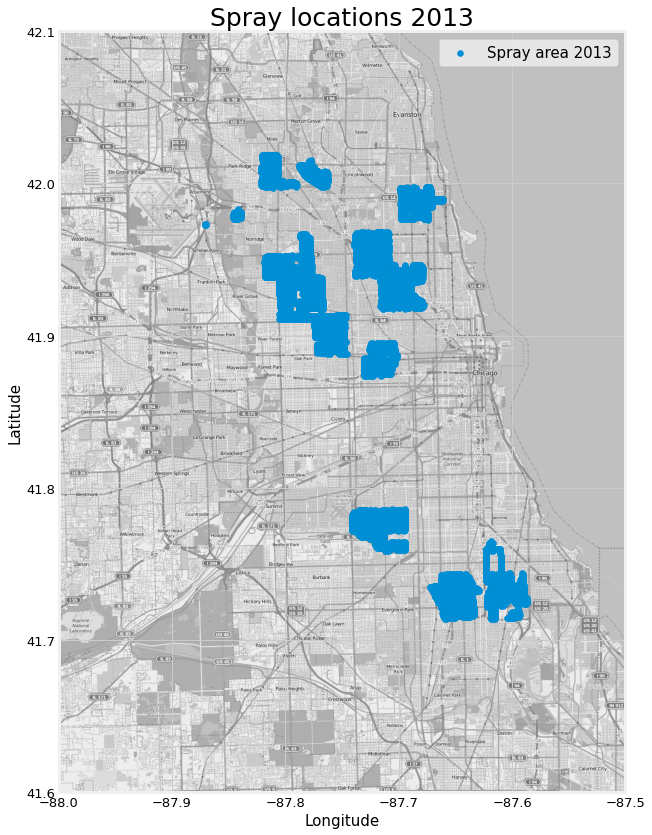

In [108]:
mapdata = np.loadtxt("../datasets/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

spray_locations = spray2[['Longitude', 'Latitude']].drop_duplicates().values


plt.scatter(spray_locations[:,0], spray_locations[:,1])
# plt.scatter(-87.933, 41.995, marker='o', s=100)
# plt.scatter(-87.752, 41.786, marker='o', s=100)

plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel("Longitude", fontsize=15)
plt.ylabel("Latitude", fontsize=15)
plt.title("Spray locations 2013", fontsize=25)
plt.legend(["Spray area 2013"], fontsize=15);

In [109]:
#Display all spray dates in 2013
spray2['Date'].value_counts()

2013-08-15    2668
2013-08-29    2302
2013-07-17    2202
2013-07-25    1607
2013-08-22    1587
2013-08-08    1195
2013-09-05     924
2013-08-16     141
Name: Date, dtype: int64

In [110]:
#Convert Date column to datetime
spray['Date'] = pd.to_datetime(spray['Date'])

In [111]:
train.head()

,Unnamed: 0,Date,Species,Trap,Latitude,Longitude,Block,AddressAccuracy,NumMosquitos,WnvPresent,...,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Trange,relative_humidity,Year,Month,Week,Day
0,0,2007-05-29,CULEX PIPIENS,T096,41.731922,-87.677512,22,8,1,0,...,30.1,5.8,17.0,6.95,25.5,63,2007,5,22,29
1,1,2007-05-29,CULEX PIPIENS/RESTUANS,T002,41.954690,-87.800991,41,9,1,0,...,30.1,5.8,17.0,6.95,25.5,63,2007,5,22,29
2,2,2007-05-29,CULEX PIPIENS/RESTUANS,T015,41.974089,-87.824812,79,8,1,0,...,30.1,5.8,17.0,6.95,25.5,63,2007,5,22,29
3,3,2007-05-29,CULEX PIPIENS/RESTUANS,T048,41.867108,-87.654224,11,8,1,0,...,30.1,5.8,17.0,6.95,25.5,63,2007,5,22,29
4,4,2007-05-29,CULEX PIPIENS/RESTUANS,T050,41.919343,-87.694259,21,8,1,0,...,30.1,5.8,17.0,6.95,25.5,63,2007,5,22,29


# Area of spray to trap

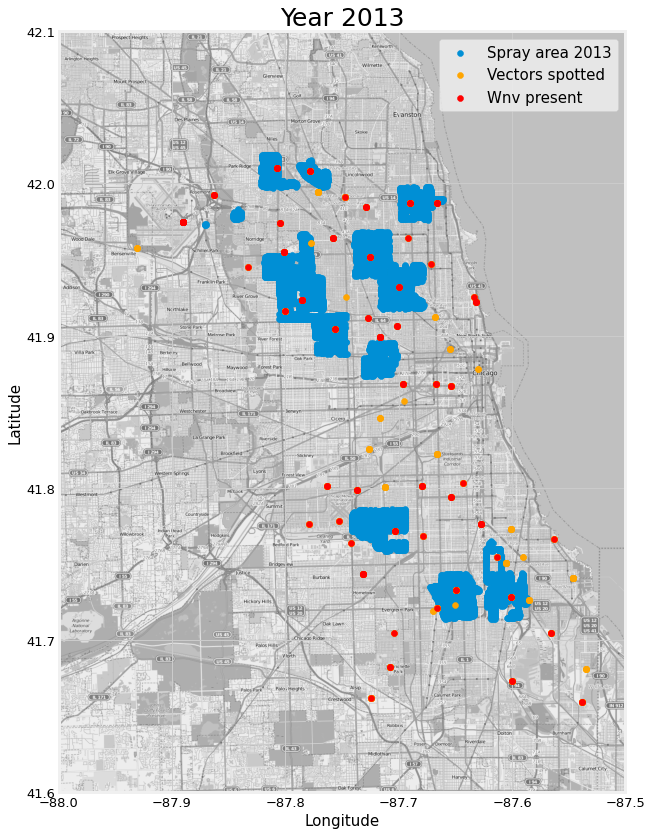

In [112]:
mapdata = np.loadtxt("../datasets/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

spray_locations = spray2[['Longitude', 'Latitude']].drop_duplicates().values

#train1 = mosquitos filtered by the 3 vectors on 2013, NumMosquitos more than 10 (declutter; less noise)
train1 = train.loc[train['Date']> '2013-01-01']
train1 = train1.loc[train1['Date']< '2014-01-01']
train1 = train1.loc[train1['NumMosquitos']> 10]
train1 = train1.apply(lambda row: row[train1['Species'].isin(['CULEX PIPIENS','CULEX PIPIENS/RESTUANS', 'CULEX RESTUANS'])])
train1_1 = train1[['Longitude', 'Latitude']].values
#train2 = wnv present
train2=train1.loc[train1['WnvPresent']==1]
train2_1 = train2[['Longitude', 'Latitude']].values

plt.scatter(spray_locations[:,0], spray_locations[:,1])
plt.scatter(train1_1[:,0], train1_1[:,1],c='orange')
plt.scatter(train2_1[:,0], train2_1[:,1], c='red')


plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel("Longitude", fontsize=15)
plt.ylabel("Latitude", fontsize=15)
plt.title("Year 2013", fontsize=25)
plt.legend(["Spray area 2013", "Vectors spotted", 'Wnv present'], fontsize=15);

In [113]:
#extracting year, month , week and day for spray
spray['Year'] = spray.Date.apply(lambda x:x.year)
spray['Month'] = spray.Date.apply(lambda x:x.month)
spray['Week'] = spray.Date.apply(lambda x:x.week)
spray['Day'] = spray.Date.apply(lambda x:x.day)

In [114]:
spray['Week'].unique()

array([36, 29, 30, 32, 33, 34, 35], dtype=int64)

In [115]:
train1 ['Week'].unique()

array([23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
      dtype=int64)

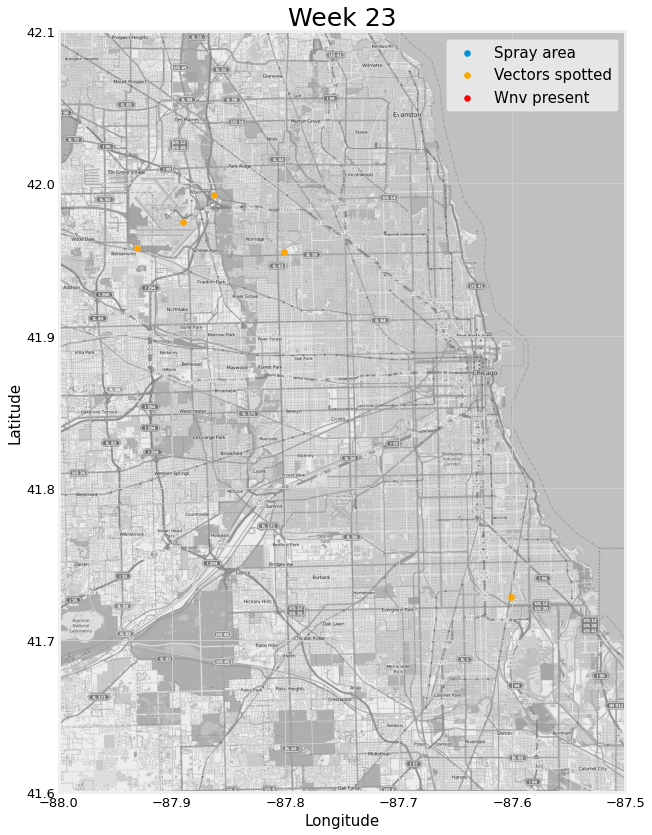

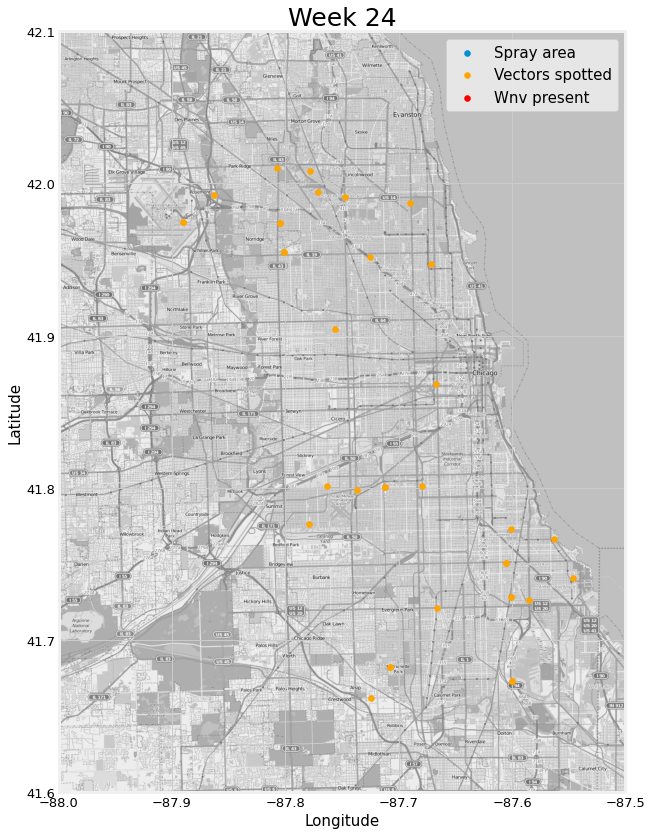

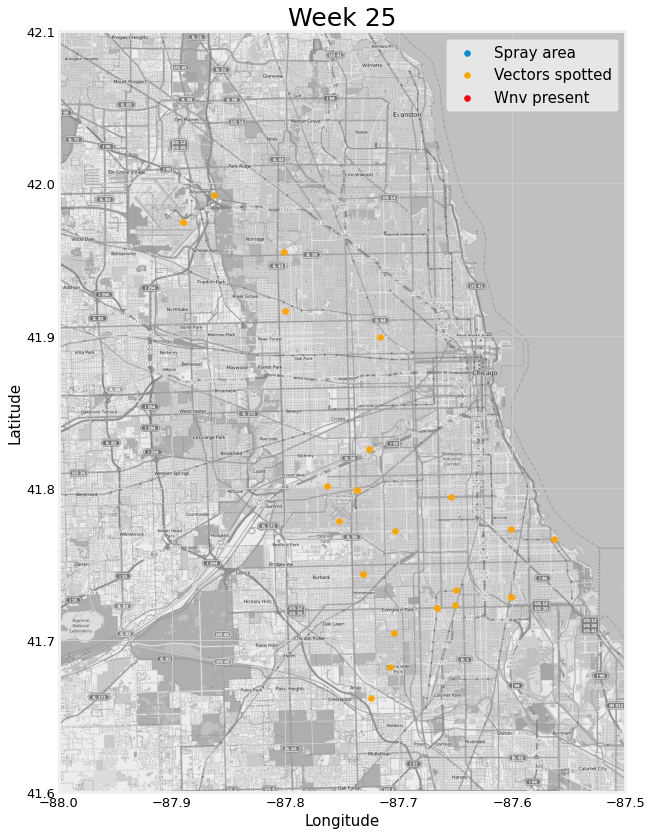

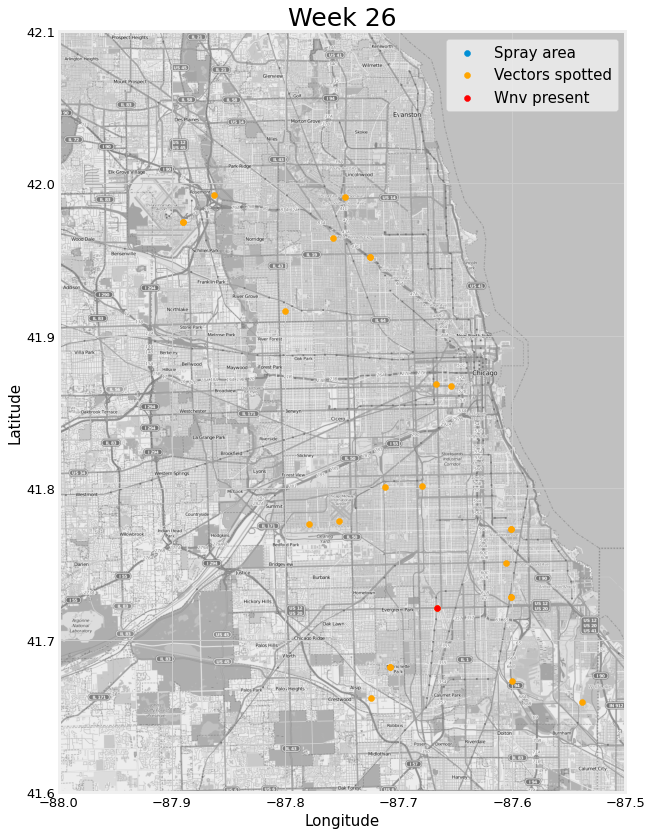

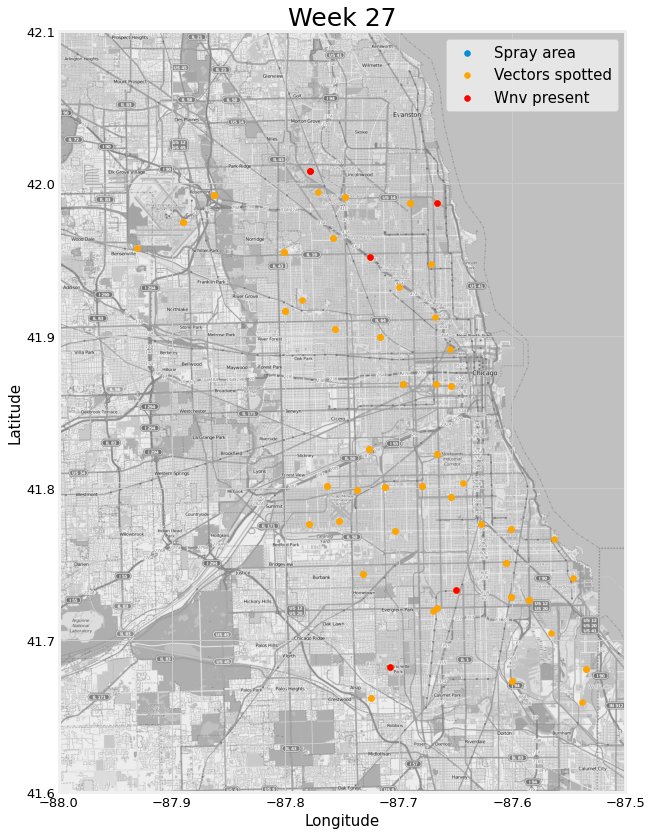

...

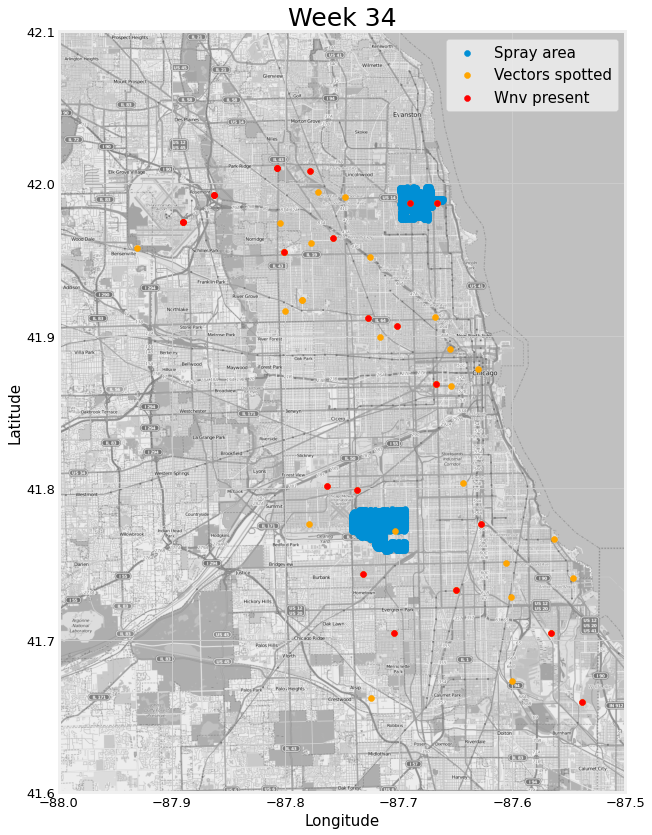

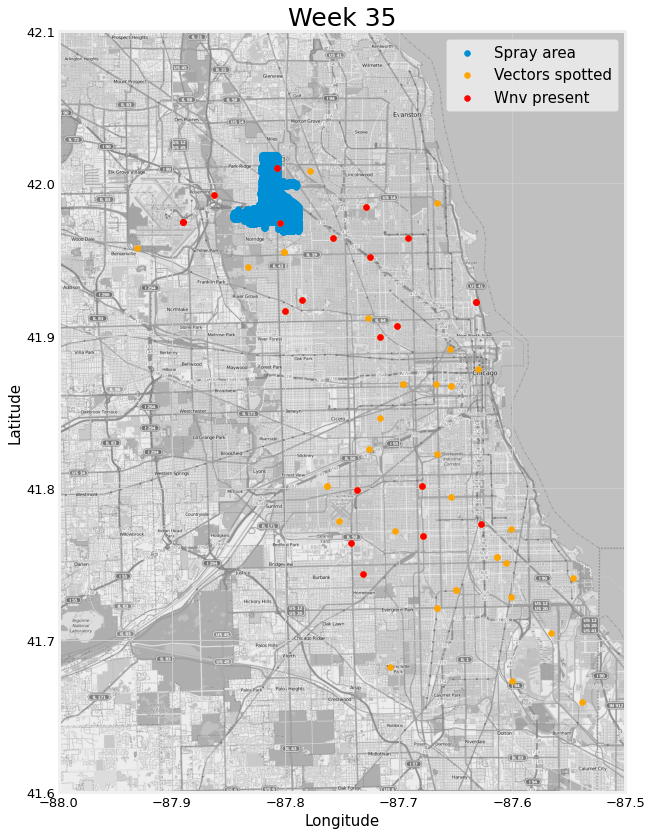

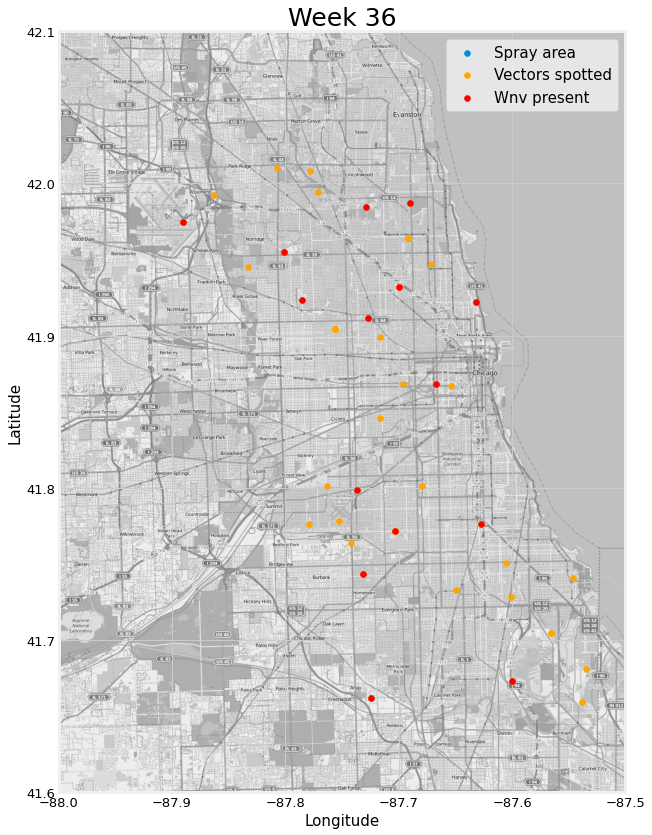

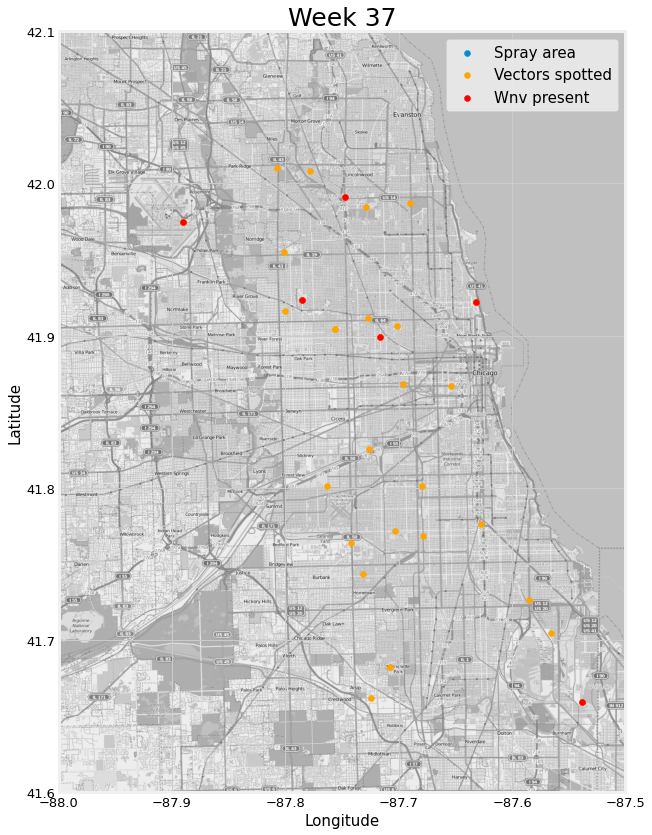

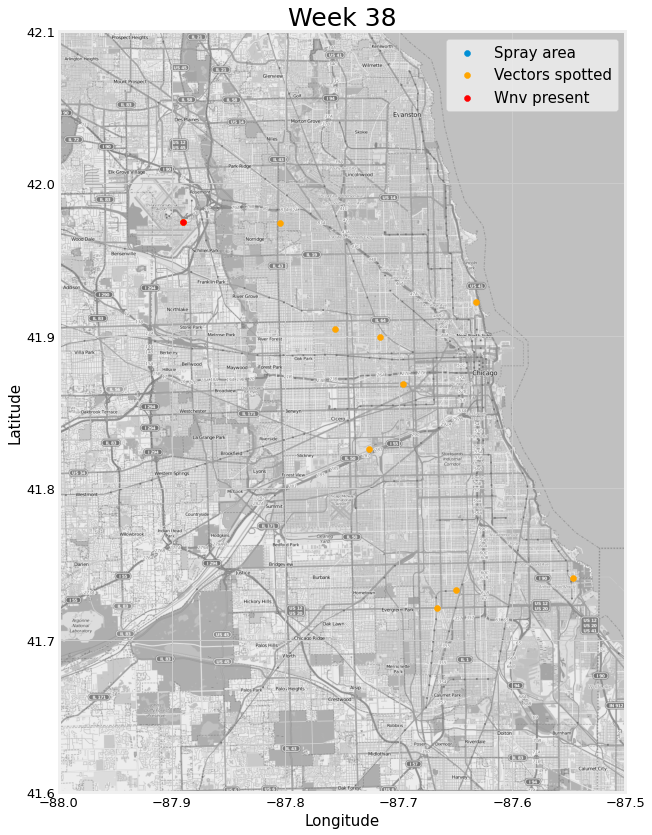

In [116]:
weeknum = 22
for week in train1 ['Week'].unique():
    weeknum = weeknum+ 1
    mapdata = np.loadtxt("../datasets/mapdata_copyright_openstreetmap_contributors.txt")
    
    aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
    lon_lat_box = (-88, -87.5, 41.6, 42.1)
    
    plt.figure(figsize=(10,14))
    plt.imshow(mapdata, 
               cmap=plt.get_cmap('gray'), 
               extent=lon_lat_box, 
               aspect=aspect)
    
    #train1 = mosquitos filtered by the 3 vectors on 2013
    spray28 =  spray.loc[spray['Week']== week]
    spray_locations = spray28[['Longitude', 'Latitude']].values
    

    #train1 = mosquitos filtered by the 3 vectors on 2013
    train28 = train1.loc[train1['Week']== week]
    train28_1 = train28[['Longitude', 'Latitude']].values
    #train2 = wnv present
    train28_2=train28.loc[train1['WnvPresent']==1]
    train28_3 = train28_2[['Longitude', 'Latitude']].values

    plt.scatter(spray_locations[:,0], spray_locations[:,1])
    plt.scatter(train28_1[:,0], train28_1[:,1],c='orange')
    plt.scatter(train28_3[:,0], train28_3[:,1], c='red')


    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Longitude", fontsize=15)
    plt.ylabel("Latitude", fontsize=15)
    plt.title(f"Week {weeknum}", fontsize=25)
    plt.legend(["Spray area", "Vectors spotted", 'Wnv present'], fontsize=15);

Based on the weekly plot of spray area and Wnv present case in mosquito traps, it seems that the spray areas are mostly determined by the previous week's data of area where Traps contain Wnv positive mosquitos. However, not all Trap areas with Wnv positive case were being sprayed; hence, the spray strategy in 2013 is unknown and can be further improved. 

Nevertheless, it is clear from the weekly plot above that the spraying worked in areas with Wnv positive; as mosquitos in the same area with Wnv positive disappear in the following week after spraying.

In [117]:
train1

,Unnamed: 0,Date,Species,Trap,Latitude,Longitude,Block,AddressAccuracy,NumMosquitos,WnvPresent,...,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Trange,relative_humidity,Year,Month,Week,Day
6481,6481,2013-06-07,CULEX PIPIENS/RESTUANS,T227,41.728495,-87.600963,65,5,17,0,...,29.92,9.15,2.5,9.55,15.0,45,2013,6,23,7
6486,6486,2013-06-07,CULEX PIPIENS/RESTUANS,T900,41.974689,-87.890615,40,36,43,0,...,29.92,9.15,2.5,9.55,15.0,45,2013,6,23,7
6488,6488,2013-06-07,CULEX RESTUANS,T002,41.954690,-87.800991,41,9,19,0,...,29.92,9.15,2.5,9.55,15.0,45,2013,6,23,7
6490,6490,2013-06-07,CULEX RESTUANS,T009,41.992478,-87.862995,91,8,11,0,...,29.92,9.15,2.5,9.55,15.0,45,2013,6,23,7
6529,6529,2013-06-07,CULEX RESTUANS,T900,41.974689,-87.890615,60,54,59,0,...,29.92,9.15,2.5,9.55,15.0,45,2013,6,23,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8451,8451,2013-09-26,CULEX PIPIENS/RESTUANS,T159,41.732984,-87.649642,89,8,21,0,...,30.04,3.95,8.5,4.40,22.5,64,2013,9,39,26
8452,8452,2013-09-26,CULEX PIPIENS/RESTUANS,T209,41.740641,-87.546587,13,5,11,0,...,30.04,3.95,8.5,4.40,22.5,64,2013,9,39,26
8456,8456,2013-09-26,CULEX PIPIENS/RESTUANS,T223,41.973845,-87.805059,51,9,11,0,...,30.04,3.95,8.5,4.40,22.5,64,2013,9,39,26
8462,8462,2013-09-26,CULEX PIPIENS/RESTUANS,T230,41.904194,-87.756155,13,9,13,0,...,30.04,3.95,8.5,4.40,22.5,64,2013,9,39,26


In [118]:
train1 = train.loc[train['Date']> '2011-01-01']
train1 = train1.loc[train1['Date']< '2012-01-01']
train2 = train.loc[train['Date']> '2013-01-01']
train2 = train2.loc[train2['Date']< '2014-01-01']

In [119]:
#Total Mosquitos with Wnv Positive in 2011
train1['WnvPresent'].value_counts()[1]

50

In [120]:
#Total Mosquitos with Wnv Positive in 2013
train2['WnvPresent'].value_counts()[1]

199

In [121]:
spray1 = spray.loc[spray['Date']> '2011-01-01']
spray1 = spray1.loc[spray1['Date']< '2012-01-01']
spray2 = spray.loc[spray['Date']> '2013-01-01']
spray2 = spray2.loc[spray2['Date']< '2014-01-01']

In [122]:
#Total Spray count in 2011; 1573
spray1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1573 entries, 0 to 2113
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1573 non-null   datetime64[ns]
 1   Time       989 non-null    object        
 2   Latitude   1573 non-null   float64       
 3   Longitude  1573 non-null   float64       
 4   Year       1573 non-null   int64         
 5   Month      1573 non-null   int64         
 6   Day        1573 non-null   int64         
 7   Week       1573 non-null   int64         
dtypes: datetime64[ns](1), float64(2), int64(4), object(1)
memory usage: 110.6+ KB


In [123]:
#Total Spray count in 2011; 12626
spray2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12626 entries, 2114 to 14739
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       12626 non-null  datetime64[ns]
 1   Time       12626 non-null  object        
 2   Latitude   12626 non-null  float64       
 3   Longitude  12626 non-null  float64       
 4   Year       12626 non-null  int64         
 5   Month      12626 non-null  int64         
 6   Day        12626 non-null  int64         
 7   Week       12626 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(4), object(1)
memory usage: 887.8+ KB


| Year                      | Total Spray Count  | Total Mosquitos with Wnv \+Ve | No\. of Wnv Human case* |Ratio of Wnv Mos:Human|
|---------------------------|-------------------------------|-------------------|------------------------|----------------------|
| 2011                      | 1668                           |50               | 8                      |6.25                  |
| 2013                      | 12626                          | 199             | 37                     |5.38                  |
| Differences \(2013/2011\) | 7\.57                         | 3\.98             | 4\.63                  |0.86                      |


We can see that even though the spraying effort in 2013 increases by 7.57 times compared to 2011, the ratio of Wnv Mos:Human did not decrease by 7.57 (but by 0.86 instead).

This means that the spraying strategy has lots of room for improvement.
  
*[Chicago West Nile Virus 2019 data brief](https://www.chicago.gov/content/dam/city/depts/cdph/food_env/general/West_Nile_Virus/WNV_2018databrief_FINALJan102019.pdf)

By visually inspect the number of traps which the spraying in 2013 were conducted because of Wnv positive case (Total: 14), we can calculate the average no. of spray per Wnv postive trap.

The CDPH uses Zenivex E4 for the Vector Control Program which is usually carried out from July to September each year. Based on the spray data, the spray night is carried out once a week. The product is sprayed by a truck-mounted fogger in a process known as Ultra Low Volume (ULV) fogging. The rate of application of the fogging product is 1.5 oz per acre (**375 oz per sq km**) ([*source*](https://www.chicago.gov/content/dam/city/depts/cdph/Mosquito-Borne-Diseases/Zenivex.pdf)).

Chicago area is 607.4km sq
607.4 * 375oz = 227.775oz
227.775 oz = 218.34 fluid oz

The price of a **55 gallon (7040 fluid oz)** Zenivex E4 is estimated to be **US\$ 1045** based on 2021 value ([*source*](http://legacy.elpasotexas.gov/purchasing/docs/2016-741%20BID%20TAB.pdf?6/28/2021%209:39:13%20AM)).([Source]('https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3322011/#:~:text=Vector%20control%20cost%20%E2%89%88%24701%2C790,the%20emergency%20spray%20cost%2Deffective.'))

one spray in all chicago would cost approx (rounded up)  
218.34/7040*1045= USD$33

While the true value would be lesser since we are not spraying all chicago at any one point of time, we would use $33 for simplicity.

In [124]:
###### Average no. of spray/infected trap in 2013
avg_spray = spray[spray['Date']>'2013-01-01']['Date'].count()/14
#Average Price
avg_price = 33
avg_spray

901.8571428571429

In [125]:
# rate of use of Zenivex * total area sprayed per week * cost of Venizen per gallon * 13 weeks(Jul- Sep)
# 375 oz/sqkm * 8.43sqkm * USD1045/7040oz * 13

spray_cost = 375*8.43*1045/7040*13
print(f'The cost of spraying per year is US${round(spray_cost, 2)}')

The cost of spraying per year is US$6100.22


The estimated weekly cost per surveillance unit for mosquito traps is about US\$ 83 (in 2021 value) in California between 2004 to 2012. This includes expenses for field processing, lab processing and testing. We will use the same figure in our analysis. ([*source*](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4340646/)) Since there are 138 traps in the train dataset, the total trap surveillance cost per year is as follows:

In [126]:
# cost of trap surveillance per week * no. of traps * 13 weeks(Jul- Sep)
trap_cost = 83*138*13

print(f'The cost of trap surveillance per year is US${round(trap_cost, 2)}')

The cost of trap surveillance per year is US$148902


In [127]:
total_cost = spray_cost + trap_cost

print(f'The total cost of vector control and trap surveillance per year is US${round(total_cost, 2)}')

The total cost of vector control and trap surveillance per year is US$155002.22


# Cost Benefit Analysis/Conclusion

It was observed that about the virus is present in about 5.19% of the number of mosquitoes caught
The mosquito species containing the virus are from the genus 'Culex' and species 'Restuans' and 'Pipiens', with crossbreed Culex Restauns/Pipiens
These species are considered pests and they are likely to have very close similarities with each other.
([*source*](https://www.ecdc.europa.eu/en/all-topics-z/disease-vectors/facts/mosquito-factsheets/culex-pipiens-factsheet-experts))
([*source*](https://vectorbio.rutgers.edu/outreach/species/rest.htm))
The virus are not found in the mosquitoes species 'Erraticus', 'Salinarus', 'Tarsalis' and 'Territans' which are caught, this 
means that it is unlikely that they would carry the virus however we would not rule out that possibility.  
  
It was observed that across the years, 2007 to 2013 there are similar number of mosquitoes caught with the virus with 
the most cases recorded at July and eventually subside (decreasing trend) by November. This is due to the climate/season
and temperature changes. Refering to the linegraph, temperature and rainfall peaks at July and generally decreases towards November in similar fashion/trend. This is reflected by the number of positive cases and the number of mosquitoes caught around July to October.  

There is a slight upward trend in the presence of west nile virus. Hence We suggest that the local authorities to focus efforts on their preventive measures where areas are predicted to have at least 60% probability of having West Nile Virus.

The costs of any vector control program ideally should reduce the likelihood of citizens contracting WNV and therefore the ensuing the medical and economic costs of contracting the WNV. We will now attempt to quantify these costs.

**Further studies** 

**1) The study of weather patterns on mosquito behaviour**
As observed in our EDA section, the relationship between the weather features is still unclear. On top of this, it can be observed that the presence of WNV peaks around the approximately same few months, regardless of weather patterns. This could also indicate that there could be other influencing factors, for example dense human population in certain areas.
  
**2) Understanding mosquitos WNV transmission**
As WNV is only transmitted by either Culex Restauns, Culex Pipiens and their crossbreed, by understanding this specific species behavoir and areas that breeds them would allow us to investigate where they get the virus from and perhaps curb the spread by curbing the root problem.
  
**3) More training data**
Our model was trained on *10506* observations, but we were making predictions on *116293* observations. Our predictions may improve tremendously, if we can acquire more data for our model training.

**4) Targeted mosquito spraying and data collection efforts**  
To maximise city resources, all mosquito-borne disease statistics should be handled by a single dedicated department in the city council. That way appropriate steps can be taken quickly, eliminating administrative lag between testing and reporting. Regular mosquito pre-spraying efforts should also be undertaken in summer months at mosquito hotspots, where identified to have a higher probablity of the presence of the WNV virus.  
Mosquitoes hotspots can be the places where the traps have captured most mosquitoes or streets found with virus present.


**Individual medical costs**  
Depending on the age of the patients, the severity of the illness may vary from mild and self-limiting symptoms similar to influenza to severe conditions affecting the central nervous system.

We will use data from a similar study from California in 2005 to estimate the total medical costs incurred by each patient. In Sacramento, California, 71.8% of WNV cases were mild and influenza-like, while 28.2% of cases developed conditions affecting the central nervous systoem. On average, patients who developed serious conditions spent US\\$ 46551 on inpatient and outpatient treatment, while mild cases incurred US\\$ 167 in medical cost. Taking the weighted average, the amount spend on medical costs due to WNV is US\$ 13247 ([*source:Table 2 and 4*](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3322011/#R5))

In [128]:
#calculating individual, average cost of medical fees caused by the virus 
wnv_severe = 0.282
wnv_mild = 0.718
med_cost_severe = 46551
med_cost_mild = 167

med_w_av = round(wnv_severe*med_cost_severe + wnv_mild*med_cost_mild)
med_w_av

13247

**Economic cost**

Patients who contracted the severe form of WNV missed about 50 days of workday on average, according to the same study from California in 2005 This translates to about US\\$ 14777 per case in 2021 value. Mild cases resulted in economic loss of US\\$ 1218 per case. Once again we take the weight average which is US\$ 5042 ([*source:Table 3 and 4*](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3322011/#R5))

In [129]:
# average Economical cost per infected individual
eco_cost_severe = 14777
eco_cost_mild = 1218

eco_w_av = round(wnv_severe*eco_cost_severe + wnv_mild*eco_cost_mild)
eco_w_av

5042

In [130]:
# (medical cost/patient + economic cost/patient)* estimated WNV cases in Chicago 2013 (66)
chicago_case = 66
cost_wnv_pp = med_w_av + eco_w_av # total medical and economic cost per pax
cost_wnv = cost_wnv_pp * chicago_case
#83*138 is the cost of trap upkeep in a week
prevention_cure_ratio_average = round((med_w_av + eco_w_av)/(avg_price + 83*138),2)
print(f'The cost of contracting WNV per case per year is US$ {cost_wnv_pp}')
print(f'The cost of contracting WNV per year is US$ {cost_wnv}')
print(f'The average WNV damages for 1 individual infected (average)against cost of prevention in a week is {prevention_cure_ratio_average}')

The cost of contracting WNV per case per year is US$ 18289
The cost of contracting WNV per year is US$ 1207074
The average WNV damages for 1 individual infected (average)against cost of prevention in a week is 1.59


# Recommendations

Based on our prediction model, the mosquitoes management team can plan the spray strategy for the upcoming mosquito season on a weekly basis. 

For example, using the weather data and mosquito count of PIPIENS/RESTUANS this week to predict Wnv positive trap area for the following week. 

## Spray months

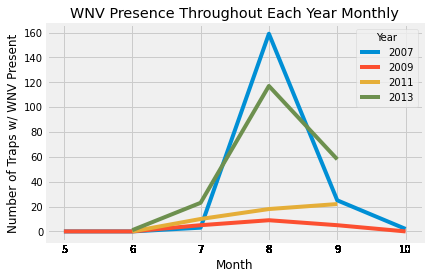

In [131]:
#The peaking between month's 7 and 9 is clearly seen, but much more prevalent in 2007 & 2013.
ax = train.groupby(by=['Year','Month'])['WnvPresent'].sum().unstack(level=0).plot(xticks=train['Month'], 
                                                                                        title='WNV Presence Throughout Each Year Monthly')
ax.set_xlabel('Month')
ax.set_ylabel('Number of Traps w/ WNV Present');

#save file
plt.savefig('../datasets/monthly_wnvpresence_wnv.png')

## Option 1
Using the prediction, spray can be conducted in all areas predicted to have at least 1 Wnv positive mosquito.

|      |   |
|------|---|
| **Pros** | Wnv positive mosquito can be dramatically reduced, thereby reducing Wnv human case  |
| **Cons** | Spraying all positive Wnv areas can be very costly   |



In [132]:
positive = train[train['WnvPresent']==1]
positive = (positive[positive['Date']> '2013-01-01'])
positive = (positive[positive['Date']< '2014-01-01'])
len(positive)

199

In [133]:
print('Estimated spending in Spraying in 2013: ${}'.format(round(spray[spray['Date']>'2013-01-01']['Date'].count()*avg_price)))

Estimated spending in Spraying in 2013: $416658


## Option 2
Using the prediction, spray can be conducted in all areas predicted to have at least 1 Wnv positive mosquito.

Using the prediciton model and the community areas as currently being used by Chicago, spray can be conducted when at least 2 traps in the same community are predicted to have Wnv positive in the following week.

|      |   |
|------|---|
| **Pros** | Reduce Wnv positive mosquitos in area of high risk while saving cost of spraying  |
| **Cons** | Singular traps with only 1 Wnv positive mosquito will be missed out despite potential risk|


For example, 9 traps should be sprayed in the plot above. In 10 week, there are a total 41 traps in the same community with more than 1 positive cases.

In [137]:
print('Total Spending for option 2: ${}'.format(round(41*avg_spray*avg_price,2)))

Total Spending for option 2: $1220212.71


## Option 3

In [135]:
# Get the top 2 latitude and longitude coordinates with wnvpresent area
wnvpresent_lat_index=[]
wnvpresent_lon_index=[]
for i in range(2):
    wnvpresent_lat_index.append(train[train['WnvPresent'] == 1].groupby('Latitude')['Longitude'].value_counts().sort_values(ascending=False).head().index[i][0])
    wnvpresent_lon_index.append(train[train['WnvPresent'] == 1].groupby('Latitude')['Longitude'].value_counts().sort_values(ascending=False).head().index[i][1])
    
wnvpresent_lat_lon = [(lat,lon) for lat,lon in zip(wnvpresent_lat_index,wnvpresent_lon_index)]
wnvpresent_lat_lon = pd.DataFrame(wnvpresent_lat_lon,columns=['Lat','Long'])
wnvpresent_lat_lon

,Lat,Long
0,41.974689,-87.890615
1,41.673408,-87.599862


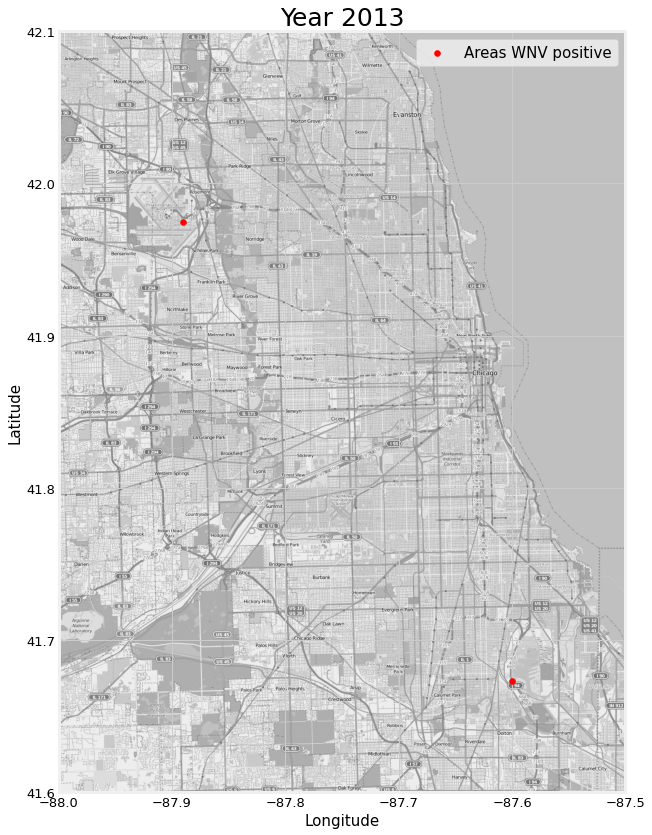

In [136]:
mapdata = np.loadtxt("../datasets/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

wnvpresent_lat_lon_1 = wnvpresent_lat_lon[['Long', 'Lat']].values

plt.scatter(wnvpresent_lat_lon_1[:,0], wnvpresent_lat_lon_1[:,1],c='red')



plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel("Longitude", fontsize=15)
plt.ylabel("Latitude", fontsize=15)
plt.title("Year 2013", fontsize=25)
plt.legend(['Areas WNV positive'], fontsize=15);

#save file
plt.savefig('../datasets/2_key_points.png')

2 of the top importance features in the random forest classification model uses Dist_0, Dist_1 to predict the presence of Wnv positive trap. These 2 features are the distances from point 0 and point 1, which are the top 2 points with the most Wnv positive trap in the train datasets. Hence, it means that the closer the traps are to these 2 point, the higher the probability of getting infected

Therefore, the spraying plan can be conducted within 5km radius of these 2 points to contain the most high risk Wnv positive Mosquitos from spreading to the rest of Chicago.

|      |   |
|------|---|
| **Pros** | Cost-effective method that only target high risk Wnv positive area based on train datasets  |
| **Cons** | Assume that most Wnv positive mosquitos came from these 2 areas while missing out other areas|

In [138]:
#cost per spray * 16 weeks mosquitoes present * 2 trap locations
print('Total Spending for option 3: ${}'.format(round(avg_price *16*2,2)))

Total Spending for option 3: $1056


# Option 4

Release genetically modified mosquitos that prevent mosquito eggs from hatching after mating with existing mosquito. This eliminate the need for long term spraying plan, providing a long term solution with an one time R&D investment cost. Further information of such method can be obtained by contacting the National Environmental Agency of Singapore, which spent SGD 5 million (USD $ 3.6 million) to build a mosquito breeding facility in 2019. [Source](https://www.channelnewsasia.com/news/singapore/wolbachia-mosquitoes-new-facility-aedes-aegypti-dengue-12145012)

|      |   |
|------|---|
| **Pros** |Long term solution that can address future moquito problems, which are bound to worsen due to global warming  |
| **Cons** |Require a significant R&D investment cost & time to implement|

# Summary

|        | Option 1                                                                           | Option 2                                                                                   | Option 3                                                                                      | Option 4                                                                                                     |
|--------|------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------------------|
| **Method** | Spray all Wnv Positive Areas                                                       | Spray based on community areas                                                             | Spray based on distance from 2 key points                                                    | Release genetically modified mosquitos                                                                       |
| **Pros**   | Wnv positive mosquito can be dramatically reduced, thereby reducing Wnv human case | Reduce Wnv positive mosquitos in area of high risk while saving cost of spraying           | Cost\-effective method that only target high risk Wnv positive area based on train datasets   | Long term solution that can address future mosquito problems, which are bound to worsen due to global warming |
| **Cons**   | Spraying all positive Wnv areas can be very costly                                 | Singular traps with only 1 Wnv positive mosquito will be missed out despite potential risk | Assume that most Wnv positive mosquitos came from these 2 areas while missing out other areas | Require a significant R&D investment cost & time to implement                                                |
| **Cost** | \$416,658 | \$$1,220,213 | \$1,056 |  \$3,599,880|


Based all the 10 weeks plot of spraying & Wnv positive trap of Chicago in 2013, we can conclude that spraying does have a positive effect on controlling Wnv human cases. However, as the spray strategy seems to be based on current week's trap data, the spraying areas are always lag by 1 week and made the spraying effort sometimes useless. 

Our model is able to predict the presence of Wnv positive in each mosquito trap, with an accuracy of (score). Using the classification model, we can predict next week's Wnv presence based on this week's data and plan the spraying strategy with the 4 options given above. 

More information would be required to make the model more accurate at predicting, such as 

1) Number of mosquito in test dataset

2) Number of Wnv human cases and area of infection

3) More spray area data other than 2011 and 2013

Nevertheless, we conclude that our random forest classificaion model has performed up to expectation in predicting Wnv presence in Chicago. 

## Other references


1. https://www.cdc.gov/westnile/statsmaps/cumMapsData.html
2. https://chicagoflaneur.com/2016/06/20/a-different-way-of-looking-at-density-in-chicago/
3. https://www.sporcle.com/games/No1LesbroinChi/populated_chicago_neighborhoods/results
4. https://www.sciencedaily.com/releases/2014/02/140210184713.htm
5. http://www.cidrap.umn.edu/news-perspective/2004/07/west-nile-magnifies-need-mosquito-control
